# Food Safety Computer Vision Project - Hairnet Model Training

The basic idea here is to find if a baker in a commercial kitchen is wearing PPE.

We take two pre-trained YOLO models which detect the head and hands. Then we train another YOLO model on the kitchen hygiene dataset and hairnet dataset to learn to detect gloves and hairnets.

Here are the steps we followed to make this project:

1. Got a YOLO model to detect a person's head from Head Detector using [Yolov8](https://github.com/AbelKidaneHaile/Reports)
2. Trained a YOLOv8 model to detect the presence or absence of hairnets. This model can even differentiate between hairnets and hats. The code for this model is [here](https://www.kaggle.com/code/laibafaisal1310/hairnet-v1-0/notebook).
3. Trained a YOLOv8 model to detect gloves. We used the Kitchen hygiene dataset for this.
4. As per the professor's recommendation, we used 100 Days of Hands. We tried to create our own model here, however we found another model that already exists.

# Setting up imports, installations and Google drive

In [1]:
!pip install -q ultralytics roboflow matplotlib seaborn opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 51.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 87.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 111.6 MB/s eta 0:00:00


In [2]:
import os
import zipfile
import requests
import matplotlib.pyplot as plt
from PIL import Image
import yaml
import cv2
import numpy as np
import seaborn as sns
from pathlib import Path
from roboflow import Roboflow
from ultralytics import YOLO
import glob
from PIL import Image
import shutil

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Datasets

Next, we will download the hairnet dataset from Roboflow, as mentioned in the notebook from kaggle.

We are training our own model here instead of using the model weights from kaggle because we wanted to add negative samples in the cases that model failed, specifically for short fuzzy hair.

We will generate these samples from DuckDuckGo.

In [4]:
# Hairnet dataset from roboflow
print("📦 Downloading dataset from Roboflow...")
rf = Roboflow(api_key="JOyOsX2ve6Gbpk8A4pfD")
project = rf.workspace("mdlz-automation").project("hair-net-detection-rpava")
version = project.version(3)
dataset = version.download("yolov8")

📦 Downloading dataset from Roboflow...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Hair-Net-Detection-3 in yolov8:: 100%|██████████| 3778/3778 [00:00<00:00, 7886.88it/s]


In [5]:
print("\n📊 Dataset Structure:")
dataset_path = dataset.location
print(f"Dataset location: {dataset_path}")

# Load data.yaml
with open(f"{dataset_path}/data.yaml", 'r') as f:
    data_config = yaml.safe_load(f)

print(f"\nClasses: {data_config['names']}")
print(f"Number of classes: {data_config['nc']}")

# Count images in each split
train_images = glob.glob(f"{dataset_path}/train/images/*")
valid_images = glob.glob(f"{dataset_path}/valid/images/*")
test_images = glob.glob(f"{dataset_path}/test/images/*") if os.path.exists(f"{dataset_path}/test/images") else []

print(f"\n📈 Dataset Statistics:")
print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(valid_images)}")
print(f"Test images: {len(test_images)}")


📊 Dataset Structure:
Dataset location: /content/Hair-Net-Detection-3

Classes: ['hairnet', 'helmet', 'person']
Number of classes: 3

📈 Dataset Statistics:
Training images: 1317
Validation images: 369
Test images: 197



🖼️ Visualizing sample images from training set...


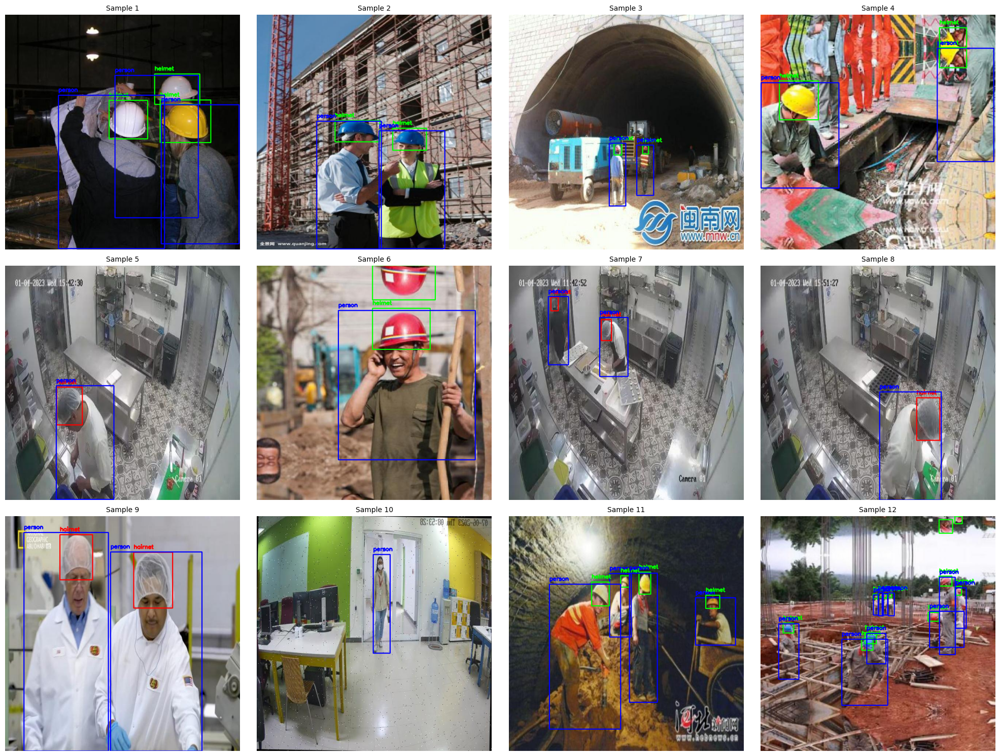

✅ Sample visualization saved as 'sample_images_visualization.png'


In [6]:
print("\n🖼️ Visualizing sample images from training set...")

def plot_sample_images(image_paths, labels_dir, class_names, n_samples=12):
    """Plot sample images with their bounding boxes"""
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.ravel()

    sample_paths = np.random.choice(image_paths, min(n_samples, len(image_paths)), replace=False)

    for idx, img_path in enumerate(sample_paths):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        # Read corresponding label file
        label_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt').replace('.png', '.txt')

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        cls_id = int(parts[0])
                        x_center, y_center, width, height = map(float, parts[1:5])

                        # Convert YOLO format to pixel coordinates
                        x1 = int((x_center - width/2) * w)
                        y1 = int((y_center - height/2) * h)
                        x2 = int((x_center + width/2) * w)
                        y2 = int((y_center + height/2) * h)

                        # Draw bounding box
                        color = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0)][cls_id]
                        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                        cv2.putText(img, class_names[cls_id], (x1, y1-10),
                                  cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        axes[idx].imshow(img)
        axes[idx].axis('off')
        axes[idx].set_title(f"Sample {idx+1}", fontsize=10)

    plt.tight_layout()
    plt.savefig('sample_images_visualization.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("✅ Sample visualization saved as 'sample_images_visualization.png'")

plot_sample_images(train_images, f"{dataset_path}/train/labels", data_config['names'])

# Generating Negative Samples

We generate samples for a person with a balding head to try to feed some negative samples into our model. Let's see how it performs.

In [ ]:
!pip install -q duckduckgo_search

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

In [ ]:
import os
import requests
from duckduckgo_search import DDGS
from fastcore.all import *
import time

# === Configuration ===
SEARCH_QUERY = "person with slightly bald head"
DOWNLOAD_DIR = "negative_hair_samples"
NUM_IMAGES = 50  # How many images to get (start with 50)
# =====================

def download_image(url, save_path):
    """Downloads an image from a URL to a file path."""
    try:
        response = requests.get(url, timeout=10)
        response.raise_for_status() # Raise an exception for bad status codes
        with open(save_path, 'wb') as f:
            f.write(response.content)
        return True
    except Exception as e:
        print(f"Failed to download {url}: {e}")
        return False

# 1. Create directories
images_dir = os.path.join(DOWNLOAD_DIR, "images")
labels_dir = os.path.join(DOWNLOAD_DIR, "labels")
os.makedirs(images_dir, exist_ok=True)
os.makedirs(labels_dir, exist_ok=True)

print(f"Searching for images for query: '{SEARCH_QUERY}'...")

# 2. Search and Download
count = 0
with DDGS() as ddgs:
    # DDGS gives a generator, so we iterate through it
    search_results = ddgs.images(SEARCH_QUERY, max_results=NUM_IMAGES + 20) # Get extra in case of failures

    for i, result in enumerate(search_results):
        if count >= NUM_IMAGES:
            break

        image_url = result['image']
        # Create a unique filename
        filename_base = f"fuzzy_hair_{count:03d}"
        image_filename = f"{filename_base}.jpg"
        label_filename = f"{filename_base}.txt"

        image_path = os.path.join(images_dir, image_filename)
        label_path = os.path.join(labels_dir, label_filename)

        print(f"Downloading image {count+1}/{NUM_IMAGES}...", end="\r")

        if download_image(image_url, image_path):
            # 3. Create the EMPTY label file
            # An empty file tells YOLO there are NO objects of interest in the corresponding image.
            open(label_path, 'w').close()
            count += 1
            # Add a small delay to be polite to servers
            time.sleep(0.5)

print(f"\nSuccessfully downloaded {count} images and created empty labels in '{DOWNLOAD_DIR}/'")

Searching for images for query: 'person with slightly bald head'...


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

RatelimitException: https://duckduckgo.com/i.js?o=json&q=person+with+slightly+bald+head&l=us-en&vqd=4-224203758244679634001135237692691919901&p=1&f=%2C%2C%2C%2C%2C 403 Ratelimit

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).


Now, we label the samples with the person class, but not the hairnet class. This is because our dataset has a person class already.

In [ ]:
from ultralytics import YOLO
import os

IMAGES_DIR = "negative_hair_samples/images"
LABELS_DIR = "negative_hair_samples/labels"
os.makedirs(LABELS_DIR, exist_ok=True)

# In 'Hair-Net-Detection-3', Person is Class 2.
USER_PERSON_CLASS_ID = 2

# Load a standard pre-trained model (trained on COCO)
# COCO Class 0 is 'person', so we can use this to auto-label!
auto_label_model = YOLO('yolov8n.pt')

print(f"Auto-labeling 'Person' (Class {USER_PERSON_CLASS_ID}) in {IMAGES_DIR}...")

image_files = [f for f in os.listdir(IMAGES_DIR) if f.endswith(('.jpg', '.png'))]

for img_file in image_files:
    img_path = os.path.join(IMAGES_DIR, img_file)
    txt_path = os.path.join(LABELS_DIR, img_file.rsplit('.', 1)[0] + ".txt")

    # Run inference to find people
    results = auto_label_model.predict(img_path, conf=0.5, verbose=False)

    found_person = False
    with open(txt_path, "w") as f:
        for result in results:
            for box in result.boxes:
                # Check if the detected object is a Person (COCO Class 0)
                if int(box.cls) == 0:
                    found_person = True

                    # Get coordinates (normalized 0-1)
                    x, y, w, h = box.xywhn[0].tolist()

                    # Write the label using YOUR dataset's ID (2)
                    # We write: <class_id> <x> <y> <w> <h>
                    f.write(f"{USER_PERSON_CLASS_ID} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    if found_person:
        print(f"Labeled: {img_file} -> mapped COCO person to Class {USER_PERSON_CLASS_ID}")
    else:
        print(f"Skipped: {img_file} (No person found)")

print("\nDone! Now your negative samples correctly label the Person but penalize the Hairnet.")

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Auto-labeling 'Person' (Class 2) in negative_hair_samples/images...


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_002.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_046.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_017.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_038.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_044.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_030.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_004.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_031.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_029.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_016.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_028.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_001.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_032.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_023.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_045.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_022.jpg -> mapped COCO person to Class 2
Skipped: fuzzy_hair_034.jpg (No person found)
Labeled: fuzzy_hair_000.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_025.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_011.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_042.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Skipped: fuzzy_hair_027.jpg (No person found)
Labeled: fuzzy_hair_018.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_003.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_015.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_012.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_041.jpg -> mapped COCO person to Class 2
Skipped: fuzzy_hair_049.jpg (No person found)
Labeled: fuzzy_hair_006.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_024.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_037.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_048.jpg -> mapped COCO person to Class 2


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_009.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_026.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_019.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_007.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_020.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_021.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_013.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_010.jpg -> mapped COCO person to Class 2
Skipped: fuzzy_hair_039.jpg (No person found)


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Labeled: fuzzy_hair_014.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_005.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_033.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_008.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_040.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_047.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_035.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_043.jpg -> mapped COCO person to Class 2
Labeled: fuzzy_hair_036.jpg -> mapped COCO person to Class 2

Done! Now your negative samples correctly label the Person but penalize the Hairnet.


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).


We merge these samples into our training samples of Hairnet-Detection-3

In [ ]:
import shutil
import os

# === CONFIGURATION ===
# Path to the new negative samples you just generated
SOURCE_DIR = "negative_hair_samples"

# Path to your MAIN dataset (where your hairnet images are)
# Update this if your folder is named differently!
# Corrected: Use the dataset_path variable from previous cell execution
MAIN_DATASET_DIR = dataset_path # Previously "datasets/Hair-Net-Detection-3"
# =====================

def move_files(source_subfolder, target_subfolder):
    src_path = os.path.join(SOURCE_DIR, source_subfolder)
    dst_path = os.path.join(MAIN_DATASET_DIR, "train", target_subfolder) # Moving to TRAIN set

    # Ensure the destination directory exists
    os.makedirs(dst_path, exist_ok=True)

    if not os.path.exists(src_path):
        print(f"Source folder not found: {src_path}")
        return

    files = os.listdir(src_path)
    print(f"Moving {len(files)} files from {source_subfolder} to {dst_path}...")

    for f in files:
        shutil.move(os.path.join(src_path, f), os.path.join(dst_path, f))

# Move Images
move_files("images", "images")

# Move Labels (The empty .txt files)
move_files("labels", "labels")

print("Merge complete! The dataset now includes the negative samples.")

datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future versio

Moving 50 files from images to /content/Hair-Net-Detection-3/train/images...
Moving 50 files from labels to /content/Hair-Net-Detection-3/train/labels...
Merge complete! Your dataset now includes the negative samples.


datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).



📊 Analyzing class distribution...


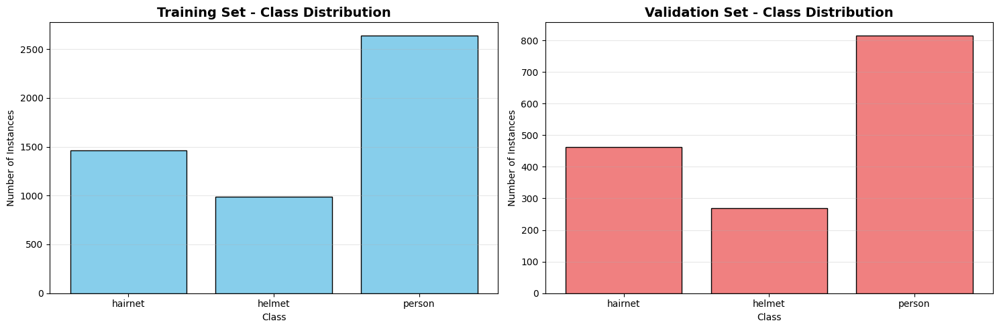

✅ Class distribution saved as 'class_distribution.png'

Training set distribution: {'hairnet': 1459, 'helmet': 990, 'person': 2641}
Validation set distribution: {'hairnet': 463, 'helmet': 270, 'person': 816}


In [7]:
print("\n📊 Analyzing class distribution...")

def count_class_distribution(labels_dir, class_names):
    """Count instances of each class"""
    class_counts = {name: 0 for name in class_names}
    label_files = glob.glob(f"{labels_dir}/*.txt")

    for label_file in label_files:
        with open(label_file, 'r') as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:
                    cls_id = int(parts[0])
                    class_counts[class_names[cls_id]] += 1

    return class_counts

train_dist = count_class_distribution(f"{dataset_path}/train/labels", data_config['names'])
valid_dist = count_class_distribution(f"{dataset_path}/valid/labels", data_config['names'])

# Plot distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.bar(train_dist.keys(), train_dist.values(), color='skyblue', edgecolor='black')
ax1.set_title('Training Set - Class Distribution', fontsize=14, fontweight='bold')
ax1.set_ylabel('Number of Instances')
ax1.set_xlabel('Class')
ax1.grid(axis='y', alpha=0.3)

ax2.bar(valid_dist.keys(), valid_dist.values(), color='lightcoral', edgecolor='black')
ax2.set_title('Validation Set - Class Distribution', fontsize=14, fontweight='bold')
ax2.set_ylabel('Number of Instances')
ax2.set_xlabel('Class')
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ Class distribution saved as 'class_distribution.png'")

print("\nTraining set distribution:", train_dist)
print("Validation set distribution:", valid_dist)


In [8]:
print("\n🚀 Starting YOLOv8 Nano training with early stopping...")
print("Configuration: 20 epochs, patience=3, early stopping enabled")

# Initialize model
model = YOLO('yolov8n.pt')

# Train model
results = model.train(
    data=f"{dataset_path}/data.yaml",
    epochs=20,
    imgsz=640,
    batch=16,
    patience=10,  # Early stopping patience
    save=True,
    device=0,  # Use GPU if available, otherwise CPU
    project='hairnet_detection',
    name='yolov8n_training',
    exist_ok=True,
    pretrained=True,
    optimizer='auto',
    verbose=True,
    seed=42,
    deterministic=True,
    single_cls=False,
    rect=False,
    cos_lr=False,
    close_mosaic=10,
    resume=False,
    amp=True,
    fraction=1.0,
    profile=False,
    overlap_mask=True,
    mask_ratio=4,
    dropout=0.0,
    val=True,
    plots=True
)

print("\n✅ Training completed!")

# ==================== LOAD BEST MODEL ====================
best_model_path = 'hairnet_detection/yolov8n_training/weights/best.pt'
best_model = YOLO(best_model_path)

print(f"\n📊 Best model loaded from: {best_model_path}")


🚀 Starting YOLOv8 Nano training with early stopping...
Configuration: 20 epochs, patience=3, early stopping enabled
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Hair-Net-Detection-3/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8n_train

In [9]:
print("\n🔍 Validating model on validation set...")
metrics = best_model.val(data=f"{dataset_path}/data.yaml", split='val')

print("\n📈 Validation Metrics:")
print(f"mAP50: {metrics.box.map50:.4f}")
print(f"mAP50-95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")


🔍 Validating model on validation set...
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1003.9±353.7 MB/s, size: 50.8 KB)
val: Scanning /content/Hair-Net-Detection-3/valid/labels.cache... 369 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 369/369 830.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 24/24 7.2it/s 3.3s
                   all        369       1549      0.924      0.888      0.935      0.614
               hairnet        218        463      0.903      0.935      0.934      0.596
                helmet        118        270      0.923      0.846      0.927      0.606
                person        334        816      0.947      0.882      0.943      0.639
Speed: 1.1ms preprocess, 2.2ms inference, 0.0ms loss, 2.2ms postprocess per image


In [10]:
if test_images:
    print("\n🧪 Evaluating on test set...")
    test_metrics = best_model.val(data=f"{dataset_path}/data.yaml", split='test')

    print("\n📈 Test Set Metrics:")
    print(f"mAP50: {test_metrics.box.map50:.4f}")
    print(f"mAP50-95: {test_metrics.box.map:.4f}")
    print(f"Precision: {test_metrics.box.mp:.4f}")
    print(f"Recall: {test_metrics.box.mr:.4f}")


🧪 Evaluating on test set...
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1283.9±820.1 MB/s, size: 42.8 KB)
val: Scanning /content/Hair-Net-Detection-3/test/labels... 197 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 197/197 1.5Kit/s 0.1s
val: New cache created: /content/Hair-Net-Detection-3/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 13/13 5.1it/s 2.5s
                   all        197        846      0.863      0.879      0.908       0.59
               hairnet        127        250      0.911       0.96      0.962      0.624
                helmet         57        167      0.779      0.804      0.818      0.529
                person        183        429      0.899      0.874      0.944      0.618
Speed: 1.9ms preprocess, 2.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /content/run


🎨 Generating predictions for sample images (one per class)...

image 1/1 /content/Hair-Net-Detection-3/valid/images/vlcsnap-2021-12-23-18h00m32s888_png_jpg.rf.e25b3dd6cbf9c3d66ff258777372ad3e.jpg: 640x640 2 hairnets, 2 persons, 6.4ms
Speed: 1.6ms preprocess, 6.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Hair-Net-Detection-3/valid/images/004496_jpg.rf.2f760dbd851cd096e71ccceb0f66d60d.jpg: 640x640 1 helmet, 2 persons, 6.8ms
Speed: 1.5ms preprocess, 6.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Hair-Net-Detection-3/valid/images/vlcsnap-2021-12-23-18h00m32s888_png_jpg.rf.e25b3dd6cbf9c3d66ff258777372ad3e.jpg: 640x640 2 hairnets, 2 persons, 6.4ms
Speed: 1.4ms preprocess, 6.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


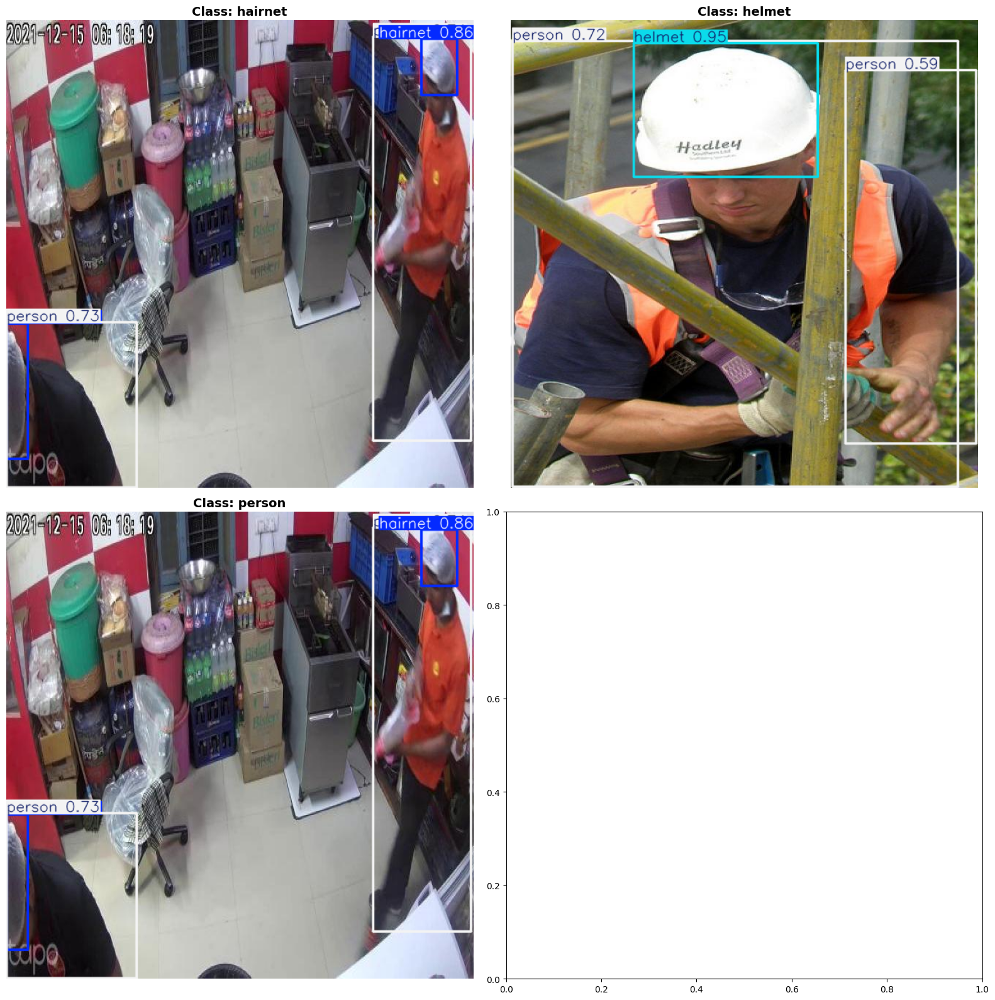

✅ Predictions saved as 'predictions_per_class.png'


In [11]:
print("\n🎨 Generating predictions for sample images (one per class)...")

def find_image_with_class(images_dir, labels_dir, class_id):
    """Find an image containing a specific class"""
    image_files = glob.glob(f"{images_dir}/*")

    for img_path in image_files:
        label_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt').replace('.png', '.txt')

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    parts = line.strip().split()
                    if len(parts) >= 5 and int(parts[0]) == class_id:
                        return img_path
    return None

# Find one sample image per class
class_samples = {}
for class_id, class_name in enumerate(data_config['names']):
    img_path = find_image_with_class(f"{dataset_path}/valid/images",
                                     f"{dataset_path}/valid/labels",
                                     class_id)
    if img_path:
        class_samples[class_name] = img_path

# Predict and visualize
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.ravel()

for idx, (class_name, img_path) in enumerate(class_samples.items()):
    if idx >= 4:
        break

    # Run prediction
    results = best_model.predict(img_path, conf=0.25, iou=0.45)

    # Plot result
    img_with_boxes = results[0].plot()
    img_rgb = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(img_rgb)
    axes[idx].axis('off')
    axes[idx].set_title(f'Class: {class_name}', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('predictions_per_class.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ Predictions saved as 'predictions_per_class.png'")

In [12]:
print("\n📊 Generating additional visualizations...")

# Plot training curves
training_results_dir = 'hairnet_detection/yolov8n_training'
if os.path.exists(f"{training_results_dir}/results.png"):
    print(f"✅ Training curves available at: {training_results_dir}/results.png")

# Confusion matrix
if os.path.exists(f"{training_results_dir}/confusion_matrix.png"):
    print(f"✅ Confusion matrix available at: {training_results_dir}/confusion_matrix.png")


📊 Generating additional visualizations...
✅ Training curves available at: hairnet_detection/yolov8n_training/results.png
✅ Confusion matrix available at: hairnet_detection/yolov8n_training/confusion_matrix.png


In [13]:
print("\n" + "="*60)
print("🎉 TRAINING PIPELINE COMPLETED SUCCESSFULLY!")
print("="*60)
print(f"\n📁 Model saved at: {best_model_path}")
print(f"📊 Training results: {training_results_dir}")
print(f"\n📈 Best Validation Metrics:")
print(f"   • mAP50: {metrics.box.map50:.4f}")
print(f"   • mAP50-95: {metrics.box.map:.4f}")
print(f"   • Precision: {metrics.box.mp:.4f}")
print(f"   • Recall: {metrics.box.mr:.4f}")
print("\n🎨 Visualizations saved:")
print("   • sample_images_visualization.png")
print("   • class_distribution.png")
print("   • predictions_per_class.png")
print("="*60)


🎉 TRAINING PIPELINE COMPLETED SUCCESSFULLY!

📁 Model saved at: hairnet_detection/yolov8n_training/weights/best.pt
📊 Training results: hairnet_detection/yolov8n_training

📈 Best Validation Metrics:
   • mAP50: 0.9350
   • mAP50-95: 0.6138
   • Precision: 0.9243
   • Recall: 0.8880

🎨 Visualizations saved:
   • sample_images_visualization.png
   • class_distribution.png
   • predictions_per_class.png



🎨 Generating side-by-side comparisons for test images (2 per class)...


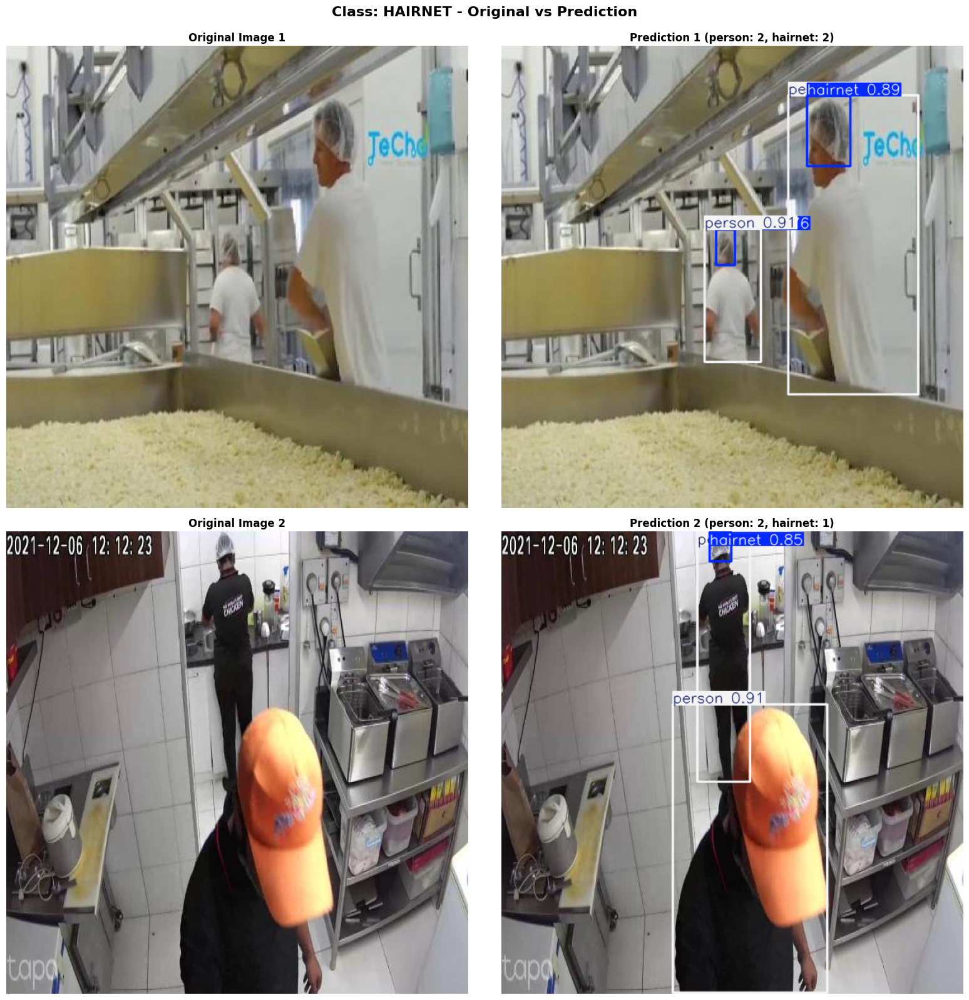

✅ Saved: test_comparison_hairnet.png


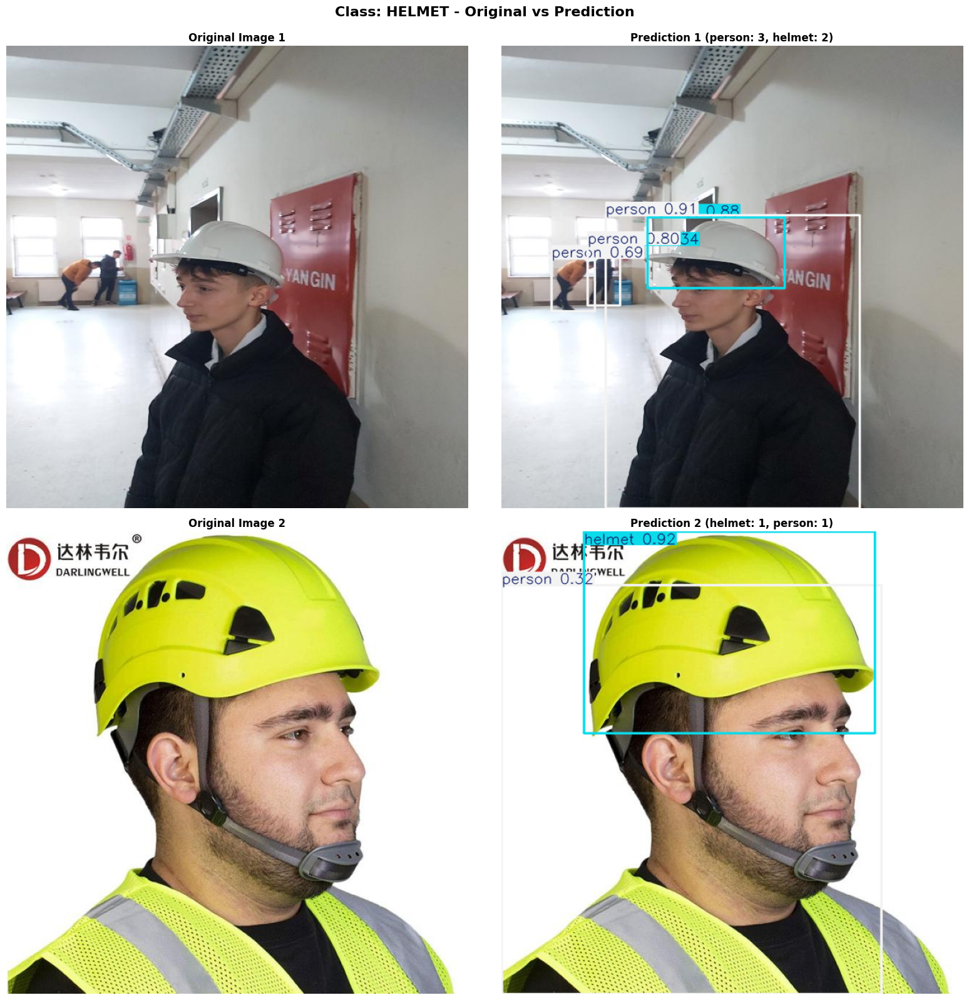

✅ Saved: test_comparison_helmet.png


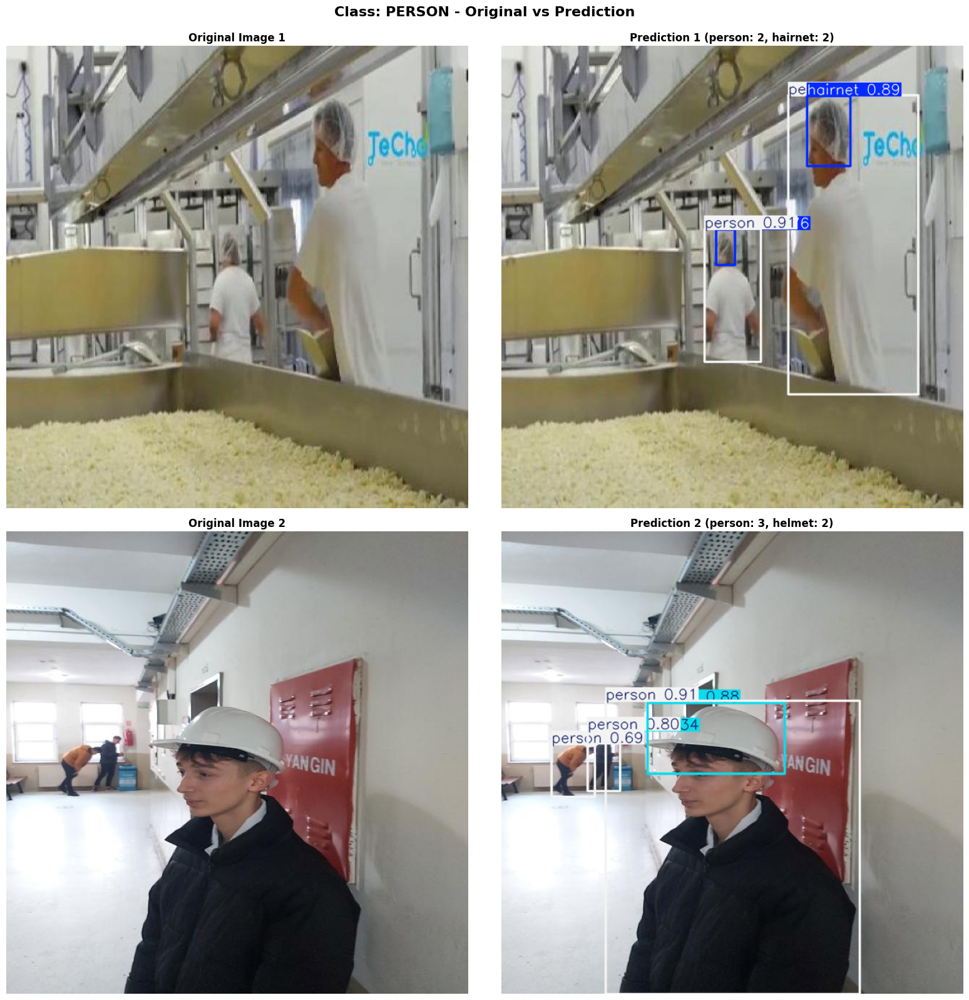

✅ Saved: test_comparison_person.png

✅ All test comparisons generated!


In [14]:
print("\n🎨 Generating side-by-side comparisons for test images (2 per class)...")

def find_images_with_class(images_dir, labels_dir, class_id, num_samples=2):
    """Find images containing a specific class"""
    image_files = glob.glob(f"{images_dir}/*")
    found_images = []

    for img_path in image_files:
        if len(found_images) >= num_samples:
            break

        label_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt').replace('.png', '.txt')

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    parts = line.strip().split()
                    if len(parts) >= 5 and int(parts[0]) == class_id:
                        found_images.append(img_path)
                        break

    return found_images

# Use test set if available, otherwise use validation set
test_dir = f"{dataset_path}/test/images" if test_images else f"{dataset_path}/valid/images"
test_labels_dir = test_dir.replace('/images', '/labels')

# Find 2 test images per class
test_samples_per_class = {}
for class_id, class_name in enumerate(data_config['names']):
    imgs = find_images_with_class(test_dir, test_labels_dir, class_id, num_samples=2)
    if imgs:
        test_samples_per_class[class_name] = imgs

# Create side-by-side comparison for each class
for class_name, img_paths in test_samples_per_class.items():
    num_images = len(img_paths)
    fig, axes = plt.subplots(num_images, 2, figsize=(16, 8*num_images))

    if num_images == 1:
        axes = axes.reshape(1, -1)

    fig.suptitle(f'Class: {class_name.upper()} - Original vs Prediction',
                 fontsize=16, fontweight='bold', y=0.995)

    for idx, img_path in enumerate(img_paths):
        # Load original image
        original_img = cv2.imread(img_path)
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

        # Get predictions
        results = best_model.predict(img_path, conf=0.25, iou=0.45, verbose=False)
        predicted_img = results[0].plot()
        predicted_img = cv2.cvtColor(predicted_img, cv2.COLOR_BGR2RGB)

        # Display original
        axes[idx, 0].imshow(original_img)
        axes[idx, 0].axis('off')
        axes[idx, 0].set_title(f'Original Image {idx+1}', fontsize=12, fontweight='bold')

        # Display prediction
        axes[idx, 1].imshow(predicted_img)
        axes[idx, 1].axis('off')

        # Count detections per class
        boxes = results[0].boxes
        if boxes is not None and len(boxes) > 0:
            det_counts = {}
            for box in boxes:
                cls_id = int(box.cls[0])
                cls_name = data_config['names'][cls_id]
                det_counts[cls_name] = det_counts.get(cls_name, 0) + 1

            det_text = ', '.join([f"{k}: {v}" for k, v in det_counts.items()])
            axes[idx, 1].set_title(f'Prediction {idx+1} ({det_text})',
                                  fontsize=12, fontweight='bold')
        else:
            axes[idx, 1].set_title(f'Prediction {idx+1} (No detections)',
                                  fontsize=12, fontweight='bold')

    plt.tight_layout()
    filename = f'test_comparison_{class_name.replace(" ", "_")}.png'
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved: {filename}")

print("\n✅ All test comparisons generated!")

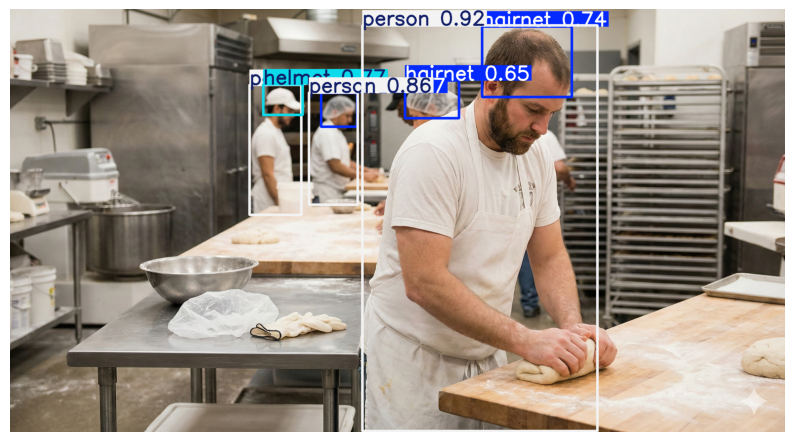

In [15]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

image_path = "/content/Gemini_Generated_Image_5f19fu5f19fu5f19.png"

# 3. Run Inference (Predict)
# conf=0.5: Only show boxes if the model is 50% sure.
# Increasing this helps reduce false positives on helmets.
results = best_model.predict(image_path, conf=0.5)

# 4. Regenerate and Show the Image with Boxes
for result in results:
    # result.plot() draws the bounding boxes and labels onto the image array
    annotated_frame = result.plot()

    # Convert Color from BGR (OpenCV format) to RGB (Matplotlib format)
    rgb_image = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

    # Display using Matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(rgb_image)
    plt.axis('off') # Hide axis numbers
    plt.show()